In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
flow_file= "./data/PEMS04/PEMS04.npz"
csv_file = "./data/PEMS04/distance.csv"
import pandas as pd
data = np.load(flow_file)
df = pd.read_csv(csv_file)
TS = data['data']
flow = TS[:,:,0]
# flow dict key is the sensor number and the value the traffic flow times serie
flow_dict={k:flow[:,k] for k in range(307)}
# list of the first 10 connected sensor, each sensor traffic flow is contained in PeMS 
sensor = set(df['from'][:5])
PeMS = {str(i):flow_dict[i] for i in sensor}
PeMS = pd.DataFrame(PeMS)
# time serie of sensor k
#creation of the datetime index
start_date = "2018-01-01 00:00:00"
end_date = "2018-02-28 23:55:00"
interval = "5min"
index = pd.date_range(start=start_date, end=end_date, freq=interval)
PeMS = PeMS.set_index(index)

In [3]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# Dataset and Model Classes

In [4]:
# Define a PyTorch dataset to generate input/target pairs for the LSTM model
class TimeSeriesDataset(Dataset):
    def __init__(self, data, window_size, stride):
        self.data = data
        self.window_size = window_size
        self.stride = stride

    def __len__(self):
        return len(self.data) - self.window_size

    def __getitem__(self, idx):
        inputs = self.data[idx:idx+self.window_size]
        target = self.data[idx+self.window_size]
        return inputs, target

In [5]:
# Define your LSTM model here with 6 LSTM layers and 1 fully connected layer
class LSTMModel(torch.nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super().__init__()
        self.lstm = torch.nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = torch.nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])
        return out

# Fed UTILS

In [6]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

import copy
def init_model(n_nodes,main_model):
    return {k:copy.deepcopy(main_model) for k in range(n_nodes)}
    
def send_model(main_model, model_dict, number_of_nodes): #send model to nodes
    with torch.no_grad():
        for i in range(number_of_nodes):
            state_dict= copy.deepcopy(main_model.state_dict())
            model_dict[i].load_state_dict(state_dict)
    return model_dict

def fedavg(main_model, model_dict, number_of_nodes): 
    state_dict = model_dict[0].state_dict()
    for name, param in model_dict[0].named_parameters():
        for i in range(1, number_of_nodes):
            state_dict[name]=  state_dict[name] + model_dict[i].state_dict()[name]
        state_dict[name] = state_dict[name]/number_of_nodes
    new_model = copy.deepcopy(main_model)
    new_model.load_state_dict(state_dict)
    return new_model


In [7]:
#define local dataset for each nodes
def local_dataset(df,nodes=5):
    # Define the sliding window size and stride
    window_size = 7
    stride = 1
    data_dict={}
    for i in range(nodes): 
        # Create datasets and data loaders for training, validation, and test sets
        train_data= pd.DataFrame(df.iloc[:,i][:'2018-02-10 00:00:00'])
        val_data = pd.DataFrame(df.iloc[:,i]['2018-02-10 00:00:00':'2018-02-14 00:00:00'])
        test_data = pd.DataFrame(df.iloc[:,i]['2018-02-14 00:00:00':])

        train_dataset = TimeSeriesDataset(train_data.values, window_size, stride)
        val_dataset = TimeSeriesDataset(val_data.values, window_size, stride)
        test_dataset = TimeSeriesDataset(test_data.values, window_size, stride)
    #Modify the data loaders to move the input data and targets to the GPU device
        train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
        train_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in train_loader]

        val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
        val_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in val_loader]

        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
        test_loader = [(inputs.to(device), targets.to(device)) for inputs, targets in test_loader]
        
        data_dict[i]={'train':train_loader,'val':val_loader,'test':test_loader,'test_data':test_data}
    return data_dict

In [8]:
import torch.cuda
def train_model(model_number,local_model,train_loader, val_loader):
  # Train your model and evaluate on the validation set
    num_epochs = 100
    # Define the loss function and optimizer
    criterion = torch.nn.MSELoss()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    local_model.to(device)
    optimizer = torch.optim.Adam(local_model.parameters(), lr=0.001)
    best_val_loss = float('inf')
    train_losses = []
    valid_losses = []
    for epoch in range(num_epochs):
        train_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            train_losses.append(loss.item())
        val_loss = 0.0
        
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = local_model(inputs.float())
            loss = criterion(outputs, targets.float())
            val_loss += loss.item()            
        val_loss /= len(val_loader)
        valid_losses.append(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(local_model.state_dict(), 'best_model_'+str(model_number)+'.pth')
        print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')
    best_model =  copy.deepcopy(local_model)
    best_model.load_state_dict(torch.load('best_model_'+str(model_number)+'.pth'))
    return best_model

In [9]:
def rmspe(y_true, y_pred):
    EPSILON = 1e-10
    return (np.sqrt(np.mean(np.square((y_true - y_pred) / (y_true + EPSILON))))) * 100

# Federated Learning

In [10]:
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)

In [11]:
data_dict = local_dataset(PeMS)

In [11]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models

In [12]:
# n_nodes = 'number of nodes'
# main_model = 'Model central'
# model_dict = init_nodes_dict(n_nodes, main_model) dictionnary of local models
main_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1)
model_dict = init_model(5,main_model)
for round in range(1,11):
    print('INIT ROUND {} :'.format(round))
    model_dict = send_model(main_model, model_dict, 5)
    for i in range(5):
        print('Training node {} for round {}'.format(i, round))
        model_dict[i] = train_model(i,model_dict[i],data_dict[i]['train'], data_dict[i]['val'])
        if round ==1:
            torch.save(main_model.state_dict(), 'local{}.pth'.format(i))
    print('FedAVG for round {}:'.format(round))
    main_model = fedavg(main_model, model_dict, 5)
    print('Done')
    torch.save(main_model.state_dict(), 'model_round_{}.pth'.format(round))
    


INIT ROUND 1 :
Training node 0 for round 1
Epoch 1/100, Training Loss: 31759390.6794, Validation Loss: 83729.0463
Epoch 2/100, Training Loss: 29519868.0090, Validation Loss: 78057.3057
Epoch 3/100, Training Loss: 27589764.6886, Validation Loss: 72840.6649
Epoch 4/100, Training Loss: 25801005.7906, Validation Loss: 67978.1212
Epoch 5/100, Training Loss: 24130963.0564, Validation Loss: 63428.3556
Epoch 6/100, Training Loss: 22568179.1808, Validation Loss: 59166.0323
Epoch 7/100, Training Loss: 21104956.8714, Validation Loss: 55172.7363
Epoch 8/100, Training Loss: 19735323.2328, Validation Loss: 51430.7210
Epoch 9/100, Training Loss: 18453830.5988, Validation Loss: 47934.6973
Epoch 10/100, Training Loss: 17258376.9655, Validation Loss: 44670.7988
Epoch 11/100, Training Loss: 16144400.5050, Validation Loss: 41629.8751
Epoch 12/100, Training Loss: 15108746.8986, Validation Loss: 38803.5925
Epoch 13/100, Training Loss: 14119487.9826, Validation Loss: 36167.6978
Epoch 14/100, Training Loss: 1

# Testing 

## Sensor 5 

FOR SENSOR 5
 
Results for ROUND 1 : 
Test MSE Loss: 31069.6217
RMSPE:157.030 % , MAAPE:49.365 %


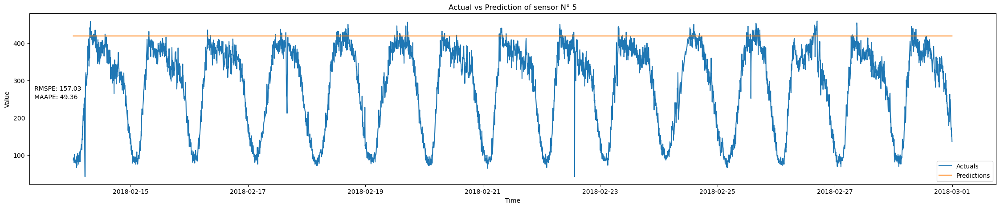

Results for ROUND 2 : 
Test MSE Loss: 50586.5854
RMSPE:182.360 % , MAAPE:63.249 %


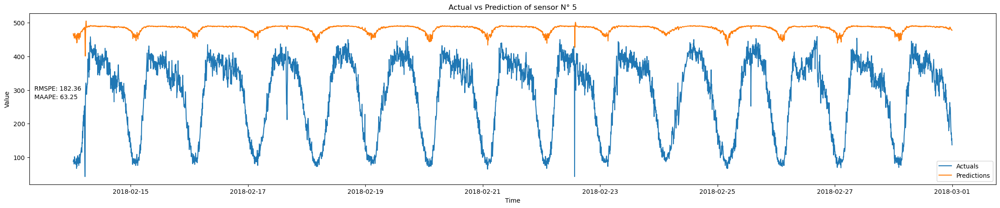

Results for ROUND 3 : 
Test MSE Loss: 14652.5219
RMSPE:105.194 % , MAAPE:41.137 %


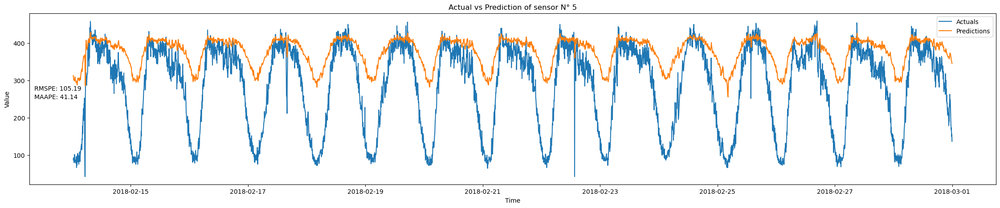

Results for ROUND 4 : 
Test MSE Loss: 2035.1233
RMSPE:23.407 % , MAAPE:16.043 %


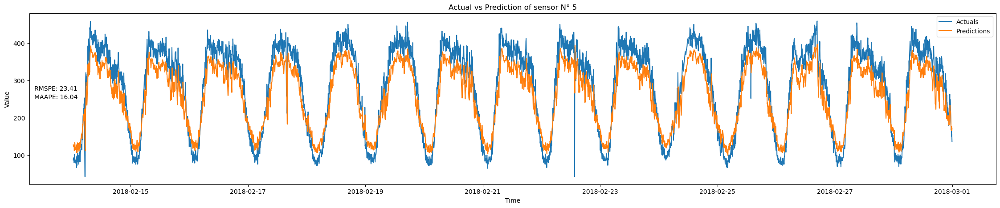

Results for ROUND 5 : 
Test MSE Loss: 764.0078
RMSPE:16.877 % , MAAPE:8.554 %


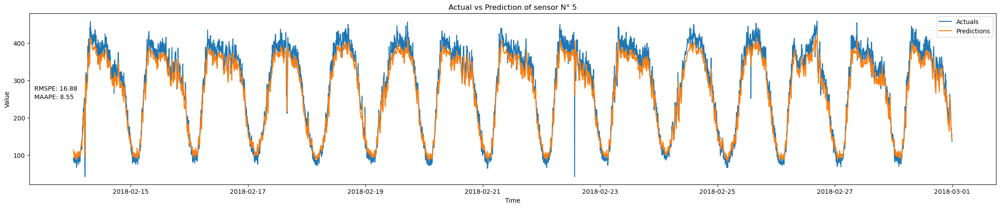

Results for ROUND 6 : 
Test MSE Loss: 479.1170
RMSPE:16.292 % , MAAPE:6.588 %


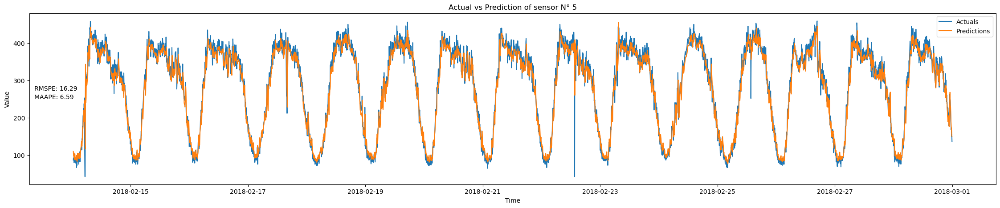

Results for ROUND 7 : 
Test MSE Loss: 466.7983
RMSPE:16.078 % , MAAPE:6.355 %


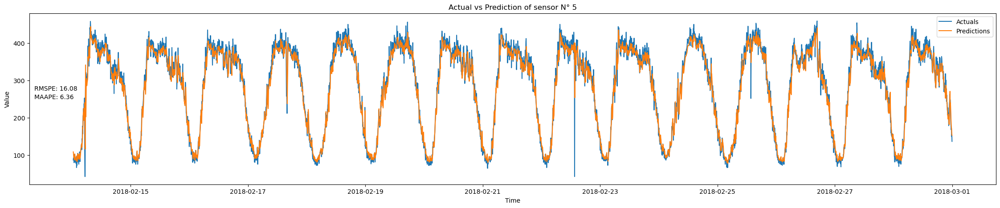

Results for ROUND 8 : 
Test MSE Loss: 446.1473
RMSPE:16.165 % , MAAPE:6.161 %


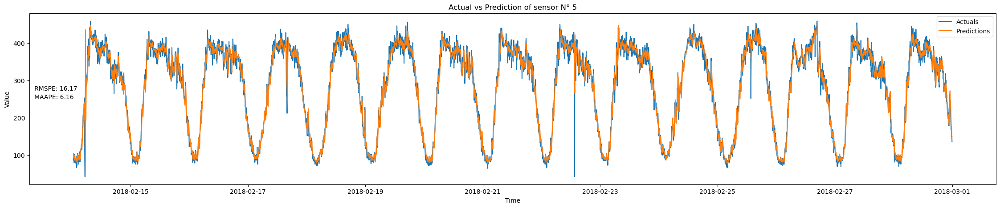

Results for ROUND 9 : 
Test MSE Loss: 504.5830
RMSPE:15.889 % , MAAPE:6.414 %


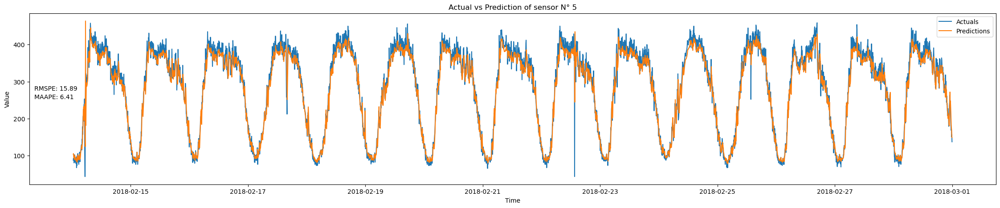

Results for ROUND 10 : 
Test MSE Loss: 469.1736
RMSPE:16.619 % , MAAPE:6.713 %


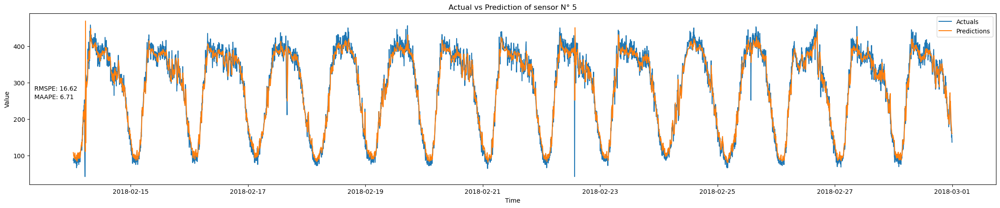

Results for Central Model : 
Test MSE Loss: 422.7689
RMSPE:15.973 % , MAAPE:6.098 %


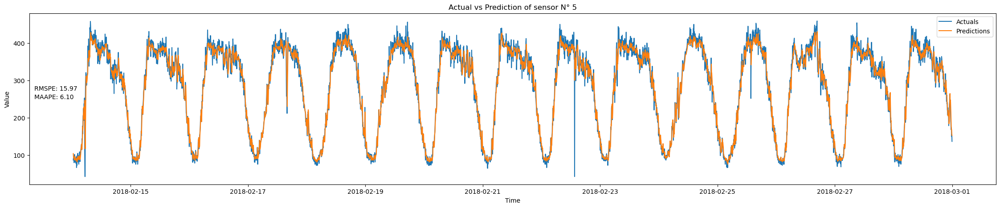

In [12]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=0 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()



## sensor 263

FOR SENSOR 263
 
Results for ROUND 1 : 
Test MSE Loss: 32666.9934
RMSPE:146.329 % , MAAPE:53.345 %


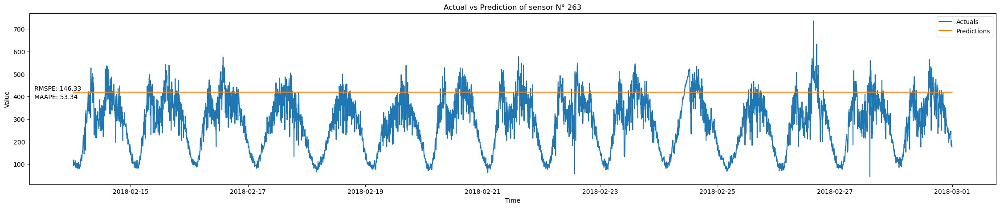

Results for ROUND 2 : 
Test MSE Loss: 52850.3382
RMSPE:172.402 % , MAAPE:65.206 %


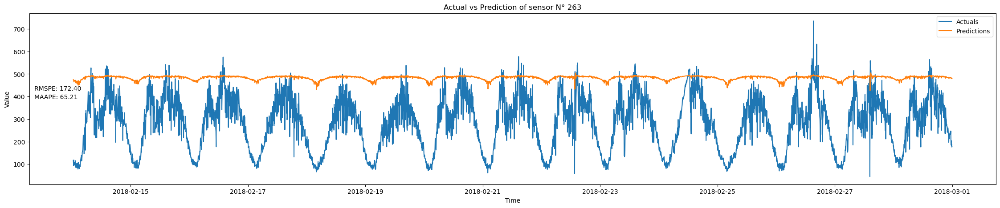

Results for ROUND 3 : 
Test MSE Loss: 16556.8733
RMSPE:99.755 % , MAAPE:44.902 %


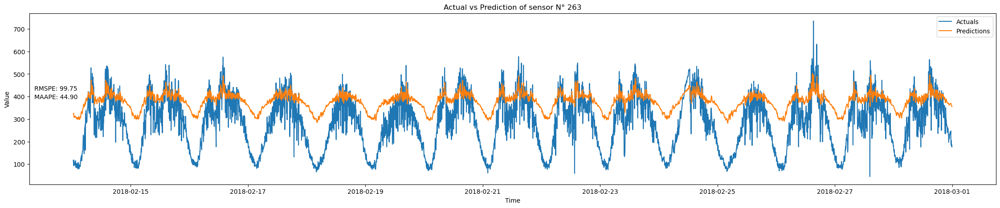

Results for ROUND 4 : 
Test MSE Loss: 3457.1683
RMSPE:25.187 % , MAAPE:17.327 %


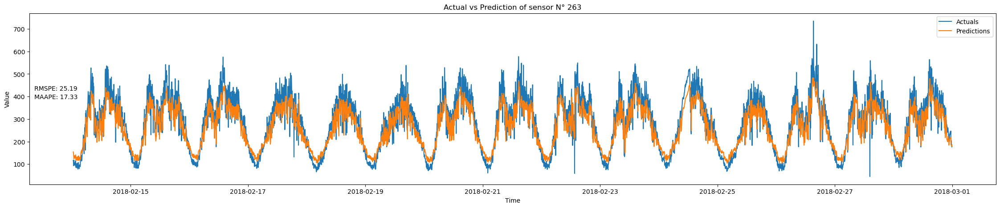

Results for ROUND 5 : 
Test MSE Loss: 2525.3496
RMSPE:21.407 % , MAAPE:12.944 %


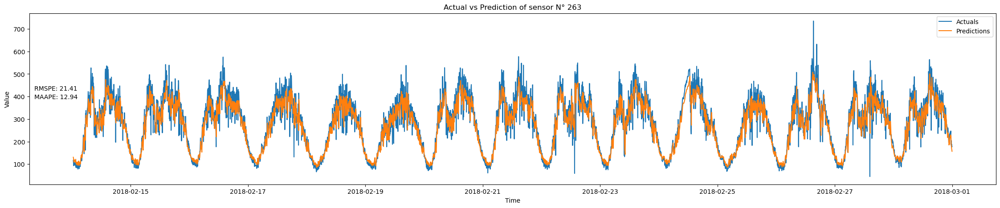

Results for ROUND 6 : 
Test MSE Loss: 2477.4839
RMSPE:21.713 % , MAAPE:12.344 %


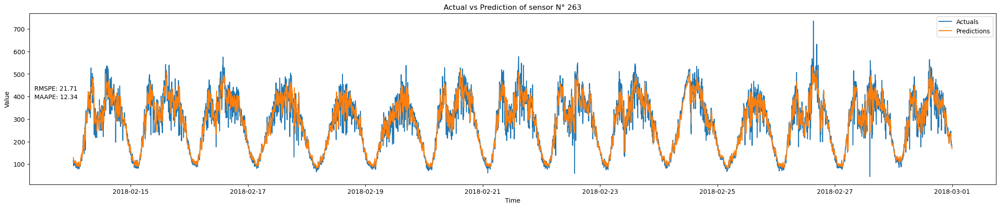

Results for ROUND 7 : 
Test MSE Loss: 2401.4390
RMSPE:21.597 % , MAAPE:12.016 %


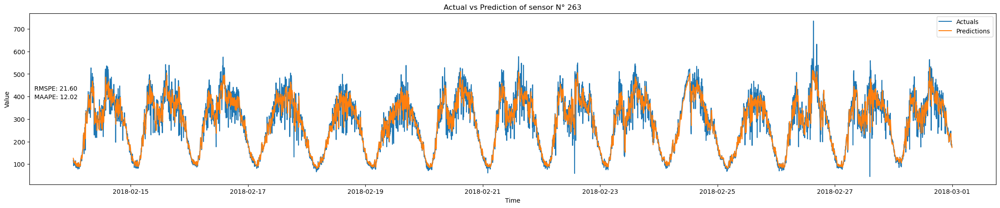

Results for ROUND 8 : 
Test MSE Loss: 2461.4628
RMSPE:22.134 % , MAAPE:12.061 %


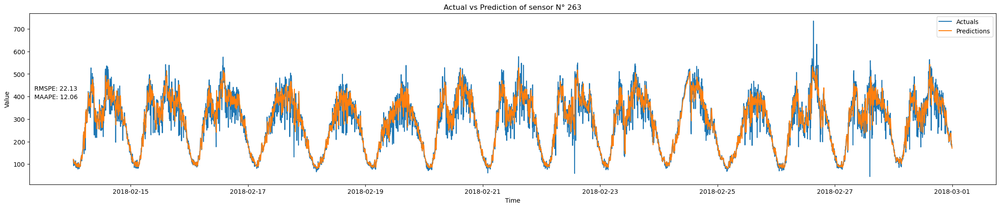

Results for ROUND 9 : 
Test MSE Loss: 2387.0644
RMSPE:21.424 % , MAAPE:11.840 %


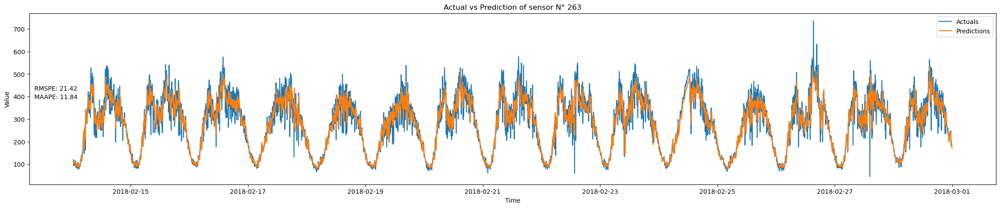

Results for ROUND 10 : 
Test MSE Loss: 2386.0710
RMSPE:22.441 % , MAAPE:12.420 %


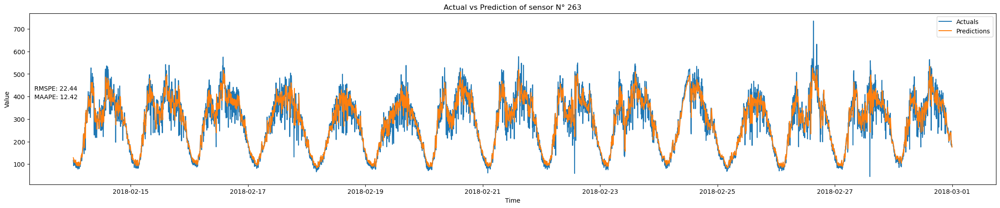

Results for Central Model : 
Test MSE Loss: 2408.5082
RMSPE:21.441 % , MAAPE:11.764 %


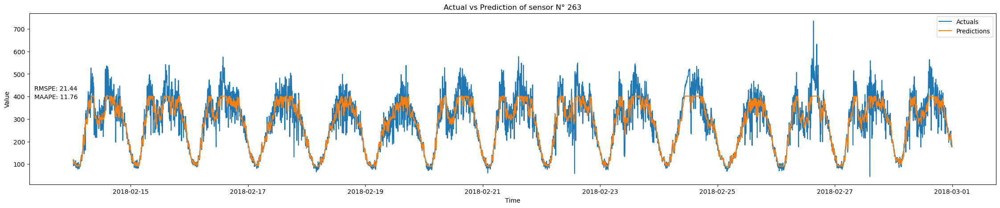

In [13]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=1 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 73

FOR SENSOR 73
 
Results for ROUND 1 : 
Test MSE Loss: 51670.9650
RMSPE:54.214 % , MAAPE:65.400 %


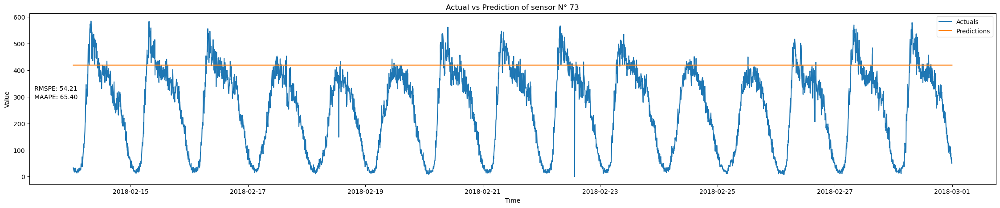

Results for ROUND 2 : 
Test MSE Loss: 49987.6787
RMSPE:56.285 % , MAAPE:74.128 %


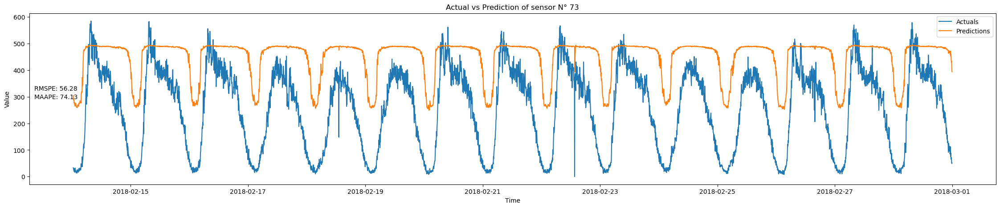

Results for ROUND 3 : 
Test MSE Loss: 12127.7278
RMSPE:45.313 % , MAAPE:54.305 %


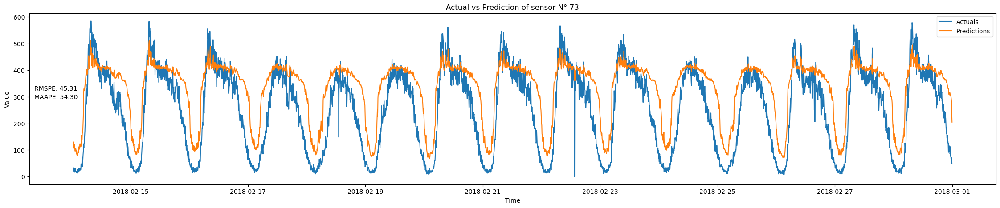

Results for ROUND 4 : 
Test MSE Loss: 2255.7677
RMSPE:29.755 % , MAAPE:28.397 %


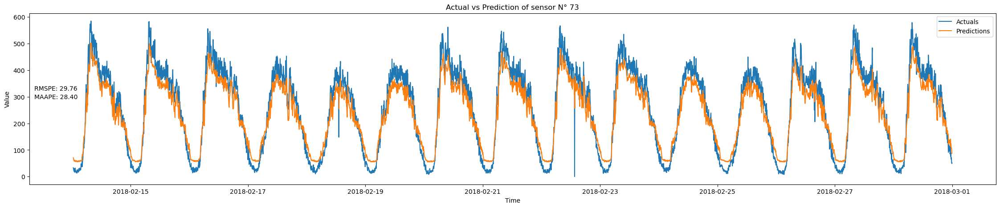

Results for ROUND 5 : 
Test MSE Loss: 1180.5089
RMSPE:26.208 % , MAAPE:23.436 %


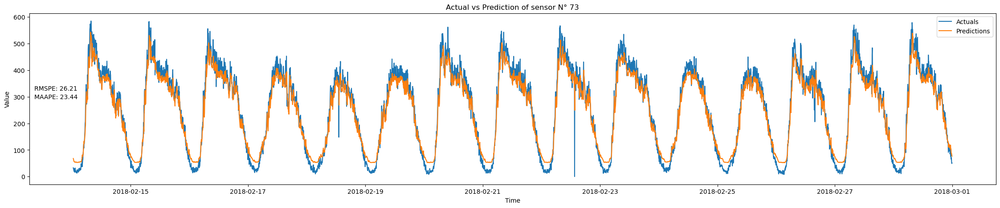

Results for ROUND 6 : 
Test MSE Loss: 875.7221
RMSPE:24.440 % , MAAPE:21.060 %


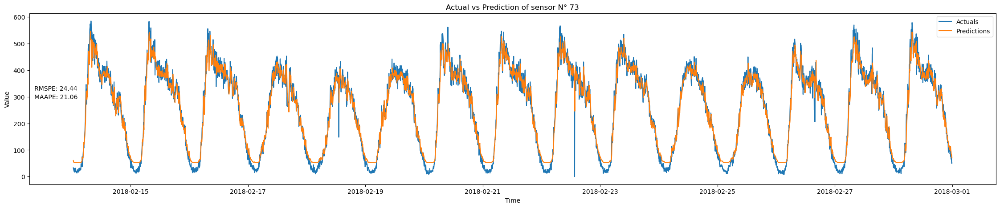

Results for ROUND 7 : 
Test MSE Loss: 822.5712
RMSPE:22.850 % , MAAPE:19.538 %


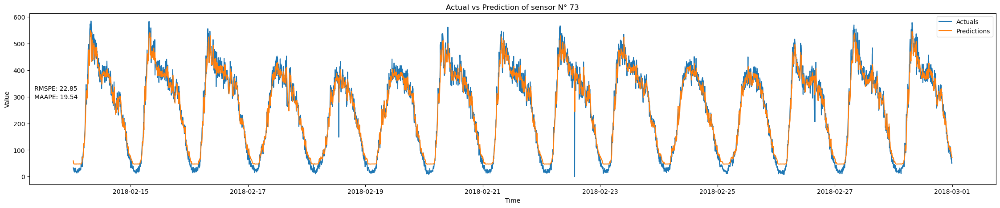

Results for ROUND 8 : 
Test MSE Loss: 751.4838
RMSPE:20.313 % , MAAPE:17.225 %


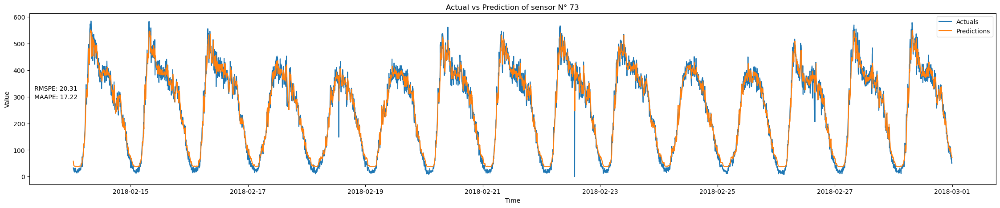

Results for ROUND 9 : 
Test MSE Loss: 824.1584
RMSPE:21.097 % , MAAPE:17.729 %


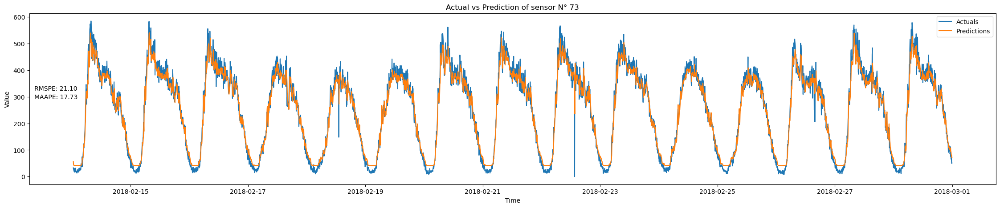

Results for ROUND 10 : 
Test MSE Loss: 751.8431
RMSPE:19.242 % , MAAPE:16.306 %


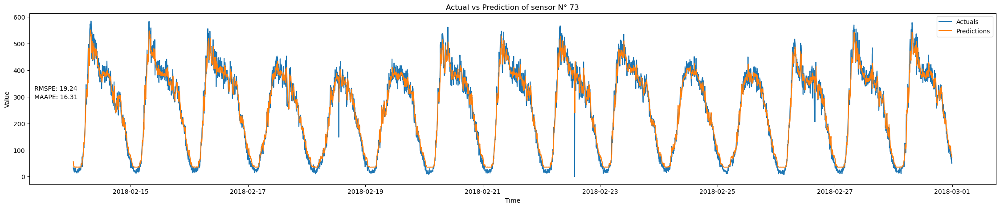

Results for Central Model : 
Test MSE Loss: 726.5822
RMSPE:14.941 % , MAAPE:10.580 %


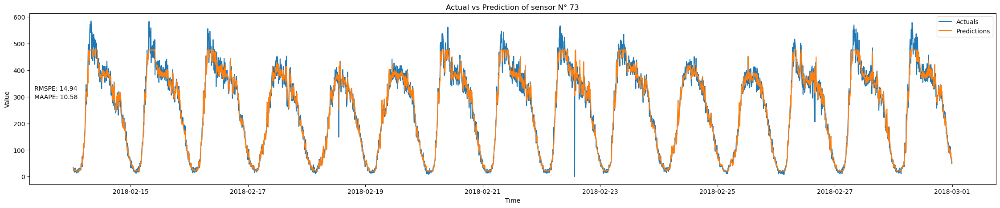

In [24]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=2 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_pred,y_true)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


14.940740184388265

## Sensor 56

FOR SENSOR 56
 
Results for ROUND 1 : 
Test MSE Loss: 35324.8544
RMSPE:44.859 % , MAAPE:49.181 %


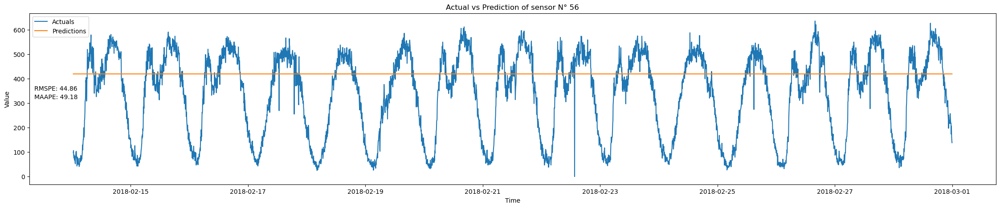

Results for ROUND 2 : 
Test MSE Loss: 42071.0480
RMSPE:45.704 % , MAAPE:52.312 %


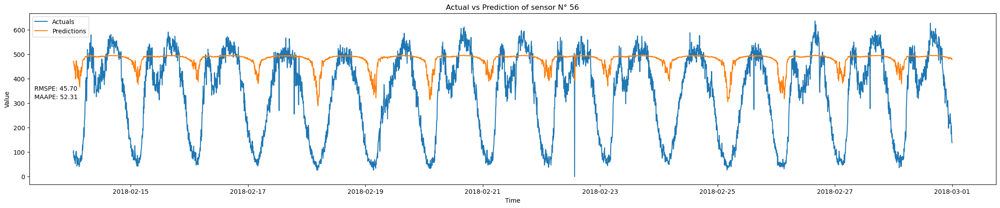

Results for ROUND 3 : 
Test MSE Loss: 12893.2096
RMSPE:37.719 % , MAAPE:40.725 %


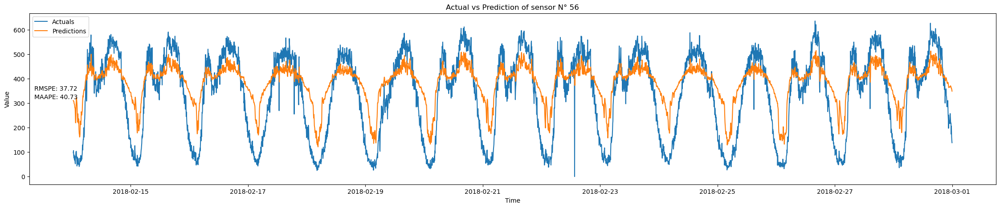

Results for ROUND 4 : 
Test MSE Loss: 2947.4093
RMSPE:20.786 % , MAAPE:18.309 %


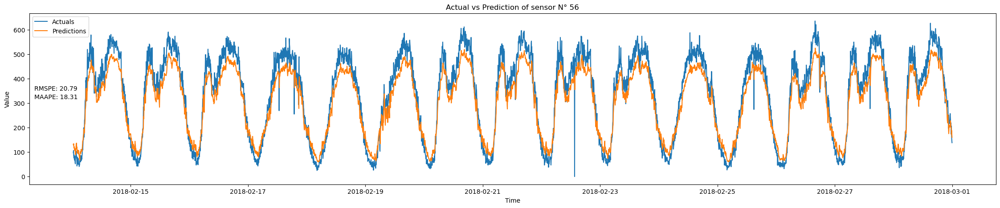

Results for ROUND 5 : 
Test MSE Loss: 1438.9616
RMSPE:15.314 % , MAAPE:12.234 %


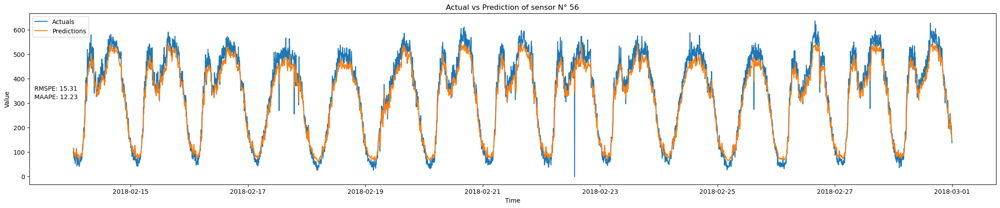

Results for ROUND 6 : 
Test MSE Loss: 1047.0439
RMSPE:12.866 % , MAAPE:10.019 %


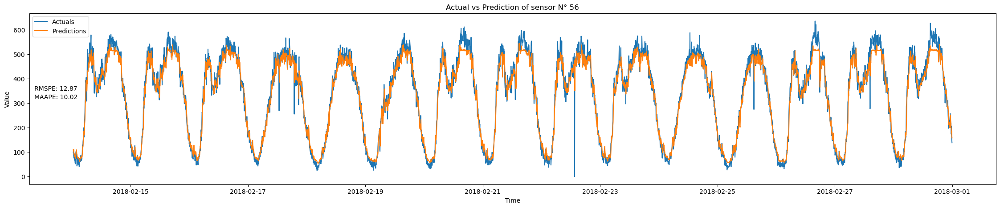

Results for ROUND 7 : 
Test MSE Loss: 966.0499
RMSPE:12.718 % , MAAPE:9.835 %


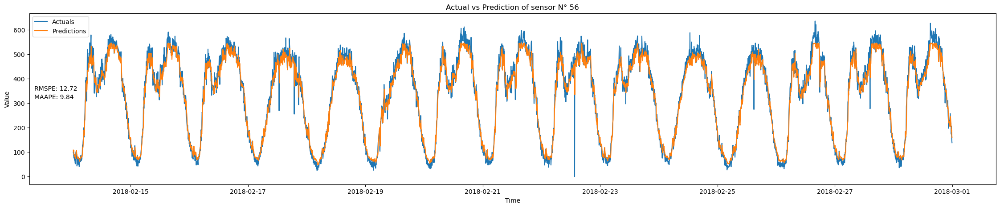

Results for ROUND 8 : 
Test MSE Loss: 876.8287
RMSPE:12.372 % , MAAPE:9.513 %


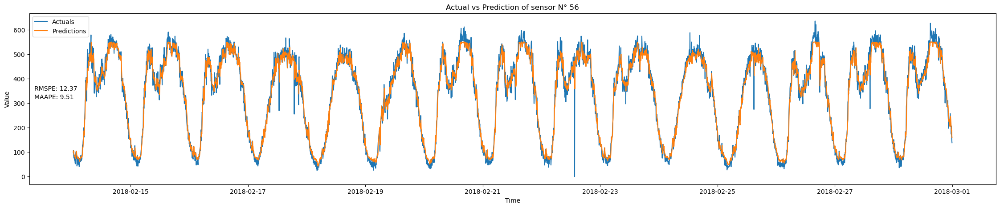

Results for ROUND 9 : 
Test MSE Loss: 1219.8785
RMSPE:12.989 % , MAAPE:10.151 %


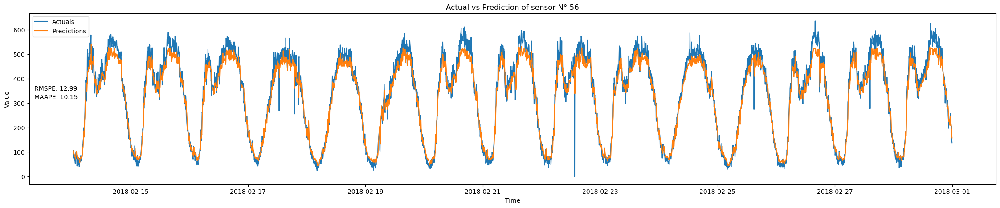

Results for ROUND 10 : 
Test MSE Loss: 1001.9828
RMSPE:12.911 % , MAAPE:10.203 %


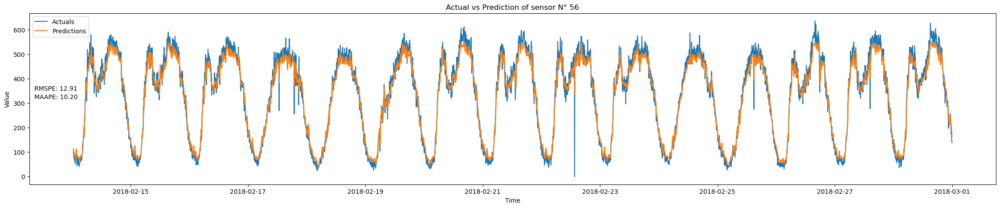

Results for Central Model : 
Test MSE Loss: 830.7880
RMSPE:11.554 % , MAAPE:8.224 %


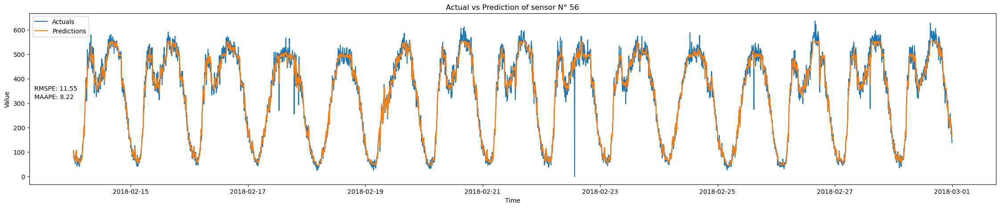

In [26]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=3 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_pred,y_true)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()


## Sensor 154

FOR SENSOR 154
 
Results for ROUND 1 : 
Test MSE Loss: 28272.5680
RMSPE:120.121 % , MAAPE:47.018 %


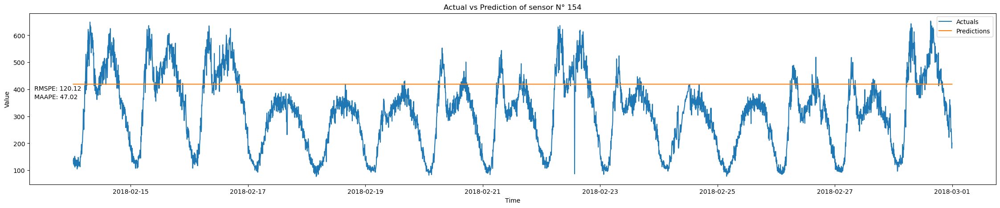

Results for ROUND 2 : 
Test MSE Loss: 44863.1745
RMSPE:144.275 % , MAAPE:56.962 %


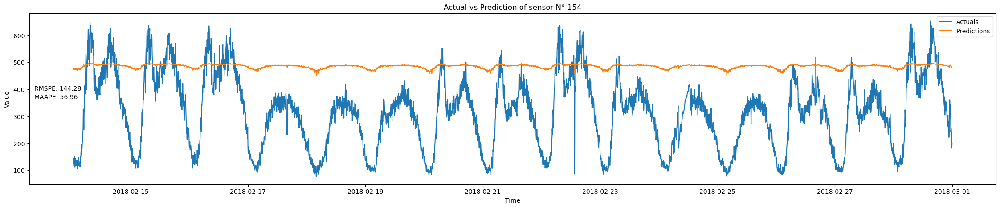

Results for ROUND 3 : 
Test MSE Loss: 13969.5916
RMSPE:82.792 % , MAAPE:38.366 %


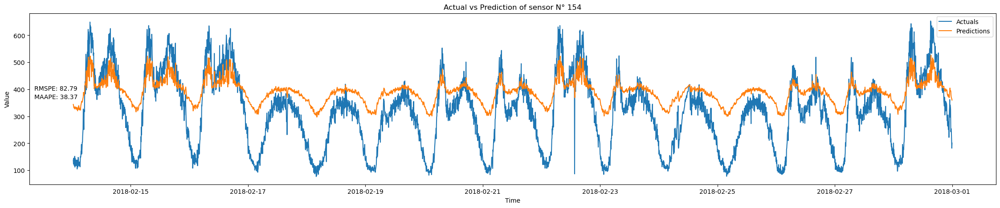

Results for ROUND 4 : 
Test MSE Loss: 2684.9143
RMSPE:18.497 % , MAAPE:14.564 %


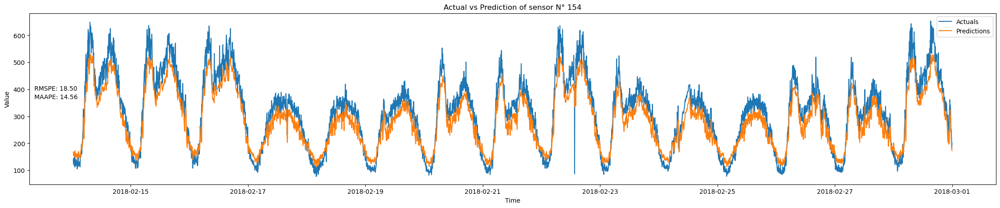

Results for ROUND 5 : 
Test MSE Loss: 1260.0386
RMSPE:12.296 % , MAAPE:8.691 %


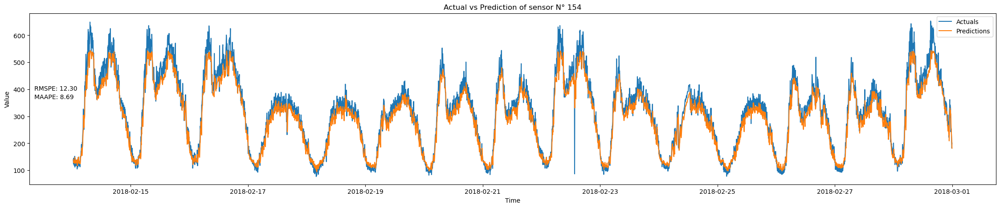

Results for ROUND 6 : 
Test MSE Loss: 971.1860
RMSPE:11.313 % , MAAPE:7.520 %


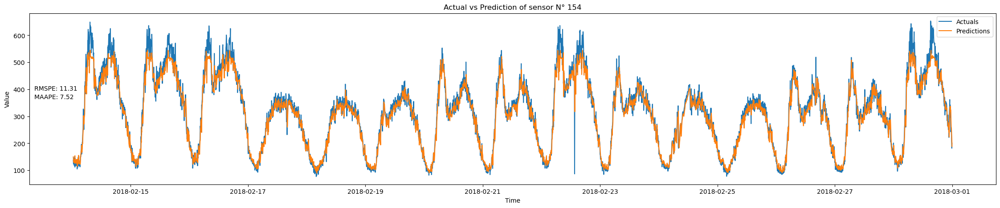

Results for ROUND 7 : 
Test MSE Loss: 890.6004
RMSPE:10.964 % , MAAPE:7.227 %


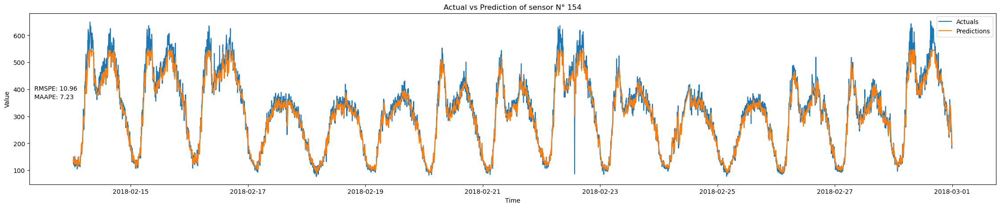

Results for ROUND 8 : 
Test MSE Loss: 813.8760
RMSPE:10.894 % , MAAPE:7.052 %


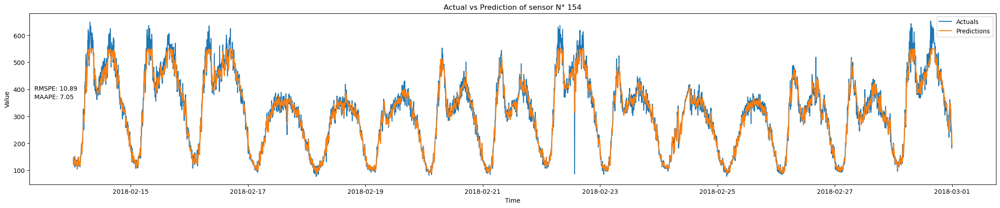

Results for ROUND 9 : 
Test MSE Loss: 1042.1922
RMSPE:10.971 % , MAAPE:7.337 %


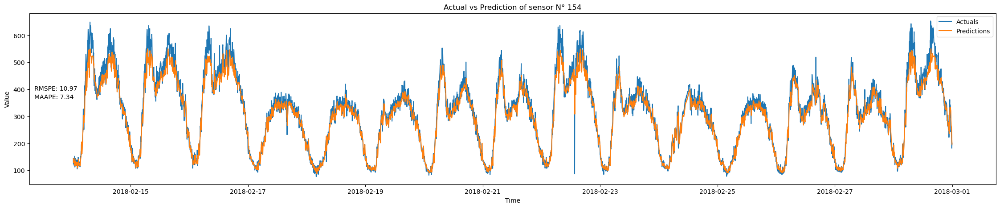

Results for ROUND 10 : 
Test MSE Loss: 870.8848
RMSPE:11.399 % , MAAPE:7.454 %


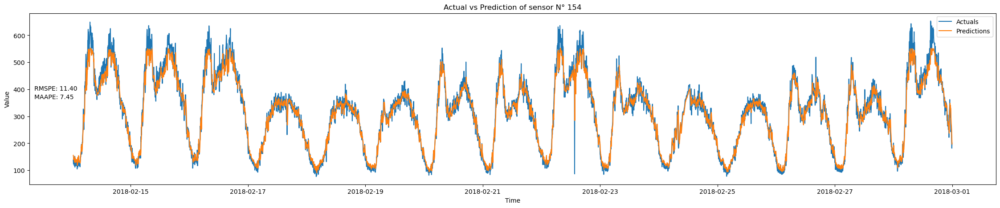

Results for Central Model : 
Test MSE Loss: 2221.0506
RMSPE:14.709 % , MAAPE:10.080 %


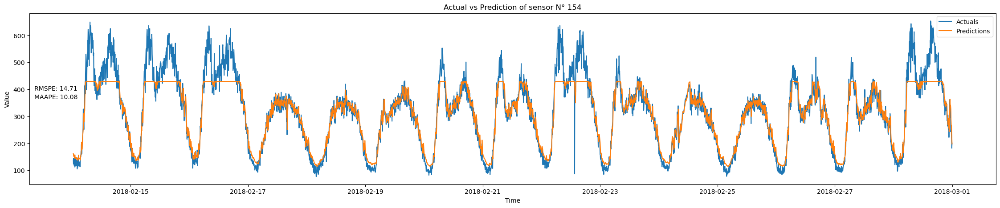

In [27]:
criterion = torch.nn.MSELoss()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

j=4 # sensor rank in dataframe
sensor = PeMS.columns[j]
print("FOR SENSOR {}".format(sensor))
print(' ')
# Load the best model and evaluate on the test set
for k in range(1,12):
    if k ==11 : 
        print("Results for Central Model : ")
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('local{}.pth'.format(j)))
    else:
        print("Results for ROUND {} : ".format(k))
        best_model = LSTMModel(input_size=1, hidden_size=32, num_layers=6, output_size=1).to(device)
        best_model.load_state_dict(torch.load('model_round_'+str(k)+'.pth'))
    best_model.double()
    best_model.eval()
    test_loader= data_dict[j]['test']
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            inputs = inputs.to(device)
            targets = targets.to(device)
            x = torch.Tensor(inputs).unsqueeze(1).to(device)
            y = torch.Tensor(targets).unsqueeze(0).to(device)
            outputs = best_model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    print(f"Test MSE Loss: {test_loss:.4f}")
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    import numpy as np
    from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
    from random import randint
    test_data = data_dict[j]['test_data']
    window_size = 7
    EPSILON = 1e-10
    i=k
    plt.figure(figsize=(28, 5))
    plt.title('Actual vs Prediction of sensor N° {}'.format(sensor))
    y_pred = predictions[:,0]
    y_true = actuals[:,0]
    plt.plot(test_data.index[window_size:],y_true, label='Actuals')
    plt.plot(test_data.index[window_size:],y_pred, label='Predictions')
    rmspe_val = rmspe(y_true,y_pred)
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    # Add evaluation metrics to the plot
    plt.annotate(f'RMSPE: {rmspe_val:.2f}', xy=(0.005, 0.55), xycoords='axes fraction')
    plt.annotate(f'MAAPE: {maape:.2f}', xy=(0.005, 0.5), xycoords='axes fraction')
    # Set x and y labels
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    print(f"RMSPE:{rmspe_val:.3f} % , MAAPE:{maape:.3f} %")
    plt.show()
